<a href="https://colab.research.google.com/github/Nov05/yelp-dataset-challenge/blob/master/notebooks/2019_12_13_Area_with_the_most_cafes.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [0]:
# 2019-12-13 created by nov05

In [0]:
from google.colab import drive
drive.mount('/content/drive')

# Imports

In [0]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import plotly.graph_objects as go
import re
from collections import Counter
from PIL import Image
from wordcloud import WordCloud, STOPWORDS, ImageColorGenerator

In [0]:
path = "/content/drive/My Drive/data/2019-12-06 yelp/yelp_dataset/csv_out/business.csv"
df_business = pd.read_csv(path)
print(df_business.shape)
df_business.head()

/usr/local/lib/python3.6/dist-packages/IPython/core/interactiveshell.py:2718: DtypeWarning:

Columns (56,58,59) have mixed types. Specify dtype option on import or set low_memory=False.



(192609, 60)


,business_id,name,address,city,state,postal_code,latitude,longitude,stars,review_count,is_open,categories,hours,attributes.GoodForKids,attributes.RestaurantsReservations,attributes.GoodForMeal,attributes.BusinessParking,attributes.Caters,attributes.NoiseLevel,attributes.RestaurantsTableService,attributes.RestaurantsTakeOut,attributes.RestaurantsPriceRange2,attributes.OutdoorSeating,attributes.BikeParking,attributes.Ambience,attributes.HasTV,attributes.WiFi,attributes.Alcohol,attributes.RestaurantsAttire,attributes.RestaurantsGoodForGroups,attributes.RestaurantsDelivery,hours.Monday,hours.Tuesday,hours.Wednesday,hours.Thursday,hours.Friday,hours.Saturday,hours.Sunday,attributes.BusinessAcceptsCreditCards,attributes,attributes.BusinessAcceptsBitcoin,attributes.ByAppointmentOnly,attributes.AcceptsInsurance,attributes.Music,attributes.GoodForDancing,attributes.CoatCheck,attributes.HappyHour,attributes.BestNights,attributes.WheelchairAccessible,attributes.DogsAllowed,attributes.BYOBCorkage,attributes.DriveThru,attributes.Smoking,attributes.AgesAllowed,attributes.HairSpecializesIn,attributes.Corkage,attributes.BYOB,attributes.DietaryRestrictions,attributes.Open24Hours,attributes.RestaurantsCounterService
0,1SWheh84yJXfytovILXOAQ,Arizona Biltmore Golf Club,2818 E Camino Acequia Drive,Phoenix,AZ,85016,33.522143,-112.018481,3.0,5,0,"Golf, Active Life",NaN,False,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,QXAEGFB4oINsVuTFxEYKFQ,Emerald Chinese Restaurant,30 Eglinton Avenue W,Mississauga,ON,L5R 3E7,43.605499,-79.652289,2.5,128,1,"Specialty Food, Restaurants, Dim Sum, Imported...",NaN,True,True,"{'dessert': False, 'latenight': False, 'lunch'...","{'garage': False, 'street': False, 'validated'...",True,u'loud',True,True,2,False,False,"{'romantic': False, 'intimate': False, 'classy...",False,u'no',u'full_bar',u'casual',True,False,9:0-0:0,9:0-0:0,9:0-0:0,9:0-0:0,9:0-1:0,9:0-1:0,9:0-0:0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,gnKjwL_1w79qoiV3IC_xQQ,Musashi Japanese Restaurant,"10110 Johnston Rd, Ste 15",Charlotte,NC,28210,35.092564,-80.859132,4.0,170,1,"Sushi Bars, Restaurants, Japanese",NaN,True,True,"{'dessert': False, 'latenight': False, 'lunch'...","{'garage': False, 'street': False, 'validated'...",False,u'average',True,True,2,False,True,"{'romantic': False, 'intimate': False, 'touris...",True,u'no',u'beer_and_wine','casual',True,False,17:30-21:30,NaN,17:30-21:30,17:30-21:30,17:30-22:0,17:30-22:0,17:30-21:0,True,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3,xvX2CttrVhyG2z1dFg_0xw,Farmers Insurance - Paul Lorenz,"15655 W Roosevelt St, Ste 237",Goodyear,AZ,85338,33.455613,-112.395596,5.0,3,1,"Insurance, Financial Services",NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,8:0-17:0,8:0-17:0,8:0-17:0,8:0-17:0,8:0-17:0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4,HhyxOkGAM07SRYtlQ4wMFQ,Queen City Plumbing,"4209 Stuart Andrew Blvd, Ste F",Charlotte,NC,28217,35.190012,-80.887223,4.0,4,1,"Plumbing, Shopping, Local Services, Home Servi...",NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,7:0-23:0,7:0-23:0,7:0-23:0,7:0-23:0,7:0-23:0,7:0-23:0,7:0-23:0,True,NaN,False,True,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [0]:
df_business.isna().sum()

business_id                                   0
name                                          0
address                                    7682
city                                          1
state                                         0
postal_code                                 659
latitude                                      0
longitude                                     0
stars                                         0
review_count                                  0
is_open                                       0
categories                                  482
hours                                    192609
attributes.GoodForKids                   126299
attributes.RestaurantsReservations       140322
attributes.GoodForMeal                   162683
attributes.BusinessParking                88896
attributes.Caters                        151981
attributes.NoiseLevel                    148730
attributes.RestaurantsTableService       175436
attributes.RestaurantsTakeOut           

In [0]:
df_business["city"].value_counts()

Las Vegas                  29370
Toronto                    18906
Phoenix                    18766
Charlotte                   9509
Scottsdale                  8837
                           ...  
QUEEN CREEK                    1
St-Benoît de Mirabel           1
CARSON                         1
Henderson and Las vegas        1
Ranlo                          1
Name: city, Length: 1203, dtype: int64

In [0]:
df_business["state"].value_counts()

AZ     56686
NV     36312
ON     33412
NC     14720
OH     14697
PA     11216
QC      9219
AB      8012
WI      5154
IL      1932
SC      1162
NY        22
CA        19
TX         6
FL         4
XGM        4
CT         3
WA         3
AL         3
XWY        2
VA         2
VT         2
AK         2
NE         2
GA         2
AR         1
BC         1
TN         1
NM         1
CON        1
BAS        1
XGL        1
UT         1
DOW        1
NJ         1
DUR        1
Name: state, dtype: int64

# Metropolitan areas on map

In [0]:
fig = go.Figure(data=go.Scattergeo(
        lon = df_business['longitude'],
        lat = df_business['latitude'],
        text = df_business['name'],
        mode = 'markers',
        # marker_color = df['cnt'],
        ))
fig.update_layout(
        title = 'Businesses in Yelp Dataset',
        geo_scope='usa',
    )
fig.show()
# there are 10 Metropolitan areas 
# as Yelp Dataset Challenge describes

In [0]:
df_business[df_business['city']=='Seattle']

,business_id,name,address,city,state,postal_code,latitude,longitude,stars,review_count,is_open,categories,hours,attributes.GoodForKids,attributes.RestaurantsReservations,attributes.GoodForMeal,attributes.BusinessParking,attributes.Caters,attributes.NoiseLevel,attributes.RestaurantsTableService,attributes.RestaurantsTakeOut,attributes.RestaurantsPriceRange2,attributes.OutdoorSeating,attributes.BikeParking,attributes.Ambience,attributes.HasTV,attributes.WiFi,attributes.Alcohol,attributes.RestaurantsAttire,attributes.RestaurantsGoodForGroups,attributes.RestaurantsDelivery,hours.Monday,hours.Tuesday,hours.Wednesday,hours.Thursday,hours.Friday,hours.Saturday,hours.Sunday,attributes.BusinessAcceptsCreditCards,attributes,attributes.BusinessAcceptsBitcoin,attributes.ByAppointmentOnly,attributes.AcceptsInsurance,attributes.Music,attributes.GoodForDancing,attributes.CoatCheck,attributes.HappyHour,attributes.BestNights,attributes.WheelchairAccessible,attributes.DogsAllowed,attributes.BYOBCorkage,attributes.DriveThru,attributes.Smoking,attributes.AgesAllowed,attributes.HairSpecializesIn,attributes.Corkage,attributes.BYOB,attributes.DietaryRestrictions,attributes.Open24Hours,attributes.RestaurantsCounterService
94152,jIyxZW8WxYsu89itv4vWSA,Mobile CellPad iPhone Repair,NaN,Seattle,WI,98112,43.063193,-89.400702,5.0,3,1,"IT Services & Computer Repair, Mobile Phone Re...",NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,9:0-21:0,9:0-21:0,9:0-21:0,10:0-13:0,9:0-21:0,9:0-17:0,9:0-17:0,True,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [0]:
df_business[df_business['city']=='Los Angeles']

,business_id,name,address,city,state,postal_code,latitude,longitude,stars,review_count,is_open,categories,hours,attributes.GoodForKids,attributes.RestaurantsReservations,attributes.GoodForMeal,attributes.BusinessParking,attributes.Caters,attributes.NoiseLevel,attributes.RestaurantsTableService,attributes.RestaurantsTakeOut,attributes.RestaurantsPriceRange2,attributes.OutdoorSeating,attributes.BikeParking,attributes.Ambience,attributes.HasTV,attributes.WiFi,attributes.Alcohol,attributes.RestaurantsAttire,attributes.RestaurantsGoodForGroups,attributes.RestaurantsDelivery,hours.Monday,hours.Tuesday,hours.Wednesday,hours.Thursday,hours.Friday,hours.Saturday,hours.Sunday,attributes.BusinessAcceptsCreditCards,attributes,attributes.BusinessAcceptsBitcoin,attributes.ByAppointmentOnly,attributes.AcceptsInsurance,attributes.Music,attributes.GoodForDancing,attributes.CoatCheck,attributes.HappyHour,attributes.BestNights,attributes.WheelchairAccessible,attributes.DogsAllowed,attributes.BYOBCorkage,attributes.DriveThru,attributes.Smoking,attributes.AgesAllowed,attributes.HairSpecializesIn,attributes.Corkage,attributes.BYOB,attributes.DietaryRestrictions,attributes.Open24Hours,attributes.RestaurantsCounterService
19062,YMeWjOd1svHDGdDCKoiGgg,Electric Daisy Carnival,7000 N Las Vegas Blvd,Los Angeles,CA,90037,36.273260,-115.009430,4.5,36,0,"Local Flavor, Festivals, Arts & Entertainment,...",NaN,False,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,True,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
137673,gavl0UJkI0Z5Dzs_tHXQ9A,Rebecca Vinacour Photography,NaN,Los Angeles,CA,90001,33.457453,-112.060988,4.5,11,1,"Session Photography, Event Planning & Services...",NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,True,NaN,True,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [0]:
df_business['categories'].value_counts()

Restaurants, Pizza                                                                                          1042
Nail Salons, Beauty & Spas                                                                                  1031
Pizza, Restaurants                                                                                           993
Beauty & Spas, Nail Salons                                                                                   947
Food, Coffee & Tea                                                                                           888
                                                                                                            ... 
Diners, Seafood, Restaurants, American (New), Steakhouses                                                      1
Country Clubs, Active Life, Event Planning & Services, Venues & Event Spaces, Golf, Arts & Entertainment       1
Vacation Rental Agents, Travel Agents, Travel Services, Tours, Hotels & Travel                  

# Cafe, coffee, tea

In [0]:
df_tmp = df_business[df_business["categories"].fillna("").str
                     .contains("^(?=.*coffee)(?=.*tea)(?=.*cafe).+", 
                               flags=re.IGNORECASE, regex=True)]
print("total 'cafe, coffee, tea' in yelp dataset:", df_tmp.shape[0])
df_tmp = df_tmp[df_tmp["state"]=='AZ']
print("total 'cafe, coffee, tea' in state AZ:", df_tmp.shape[0])
df_tmp.sample()
# Yelp datasets don't provide data for all businesses 
# within the 10 metropolitan areas

total 'cafe, coffee, tea' in yelp dataset: 1379
total 'cafe, coffee, tea' in state AZ: 175


,business_id,name,address,city,state,postal_code,latitude,longitude,stars,review_count,is_open,categories,hours,attributes.GoodForKids,attributes.RestaurantsReservations,attributes.GoodForMeal,attributes.BusinessParking,attributes.Caters,attributes.NoiseLevel,attributes.RestaurantsTableService,attributes.RestaurantsTakeOut,attributes.RestaurantsPriceRange2,attributes.OutdoorSeating,attributes.BikeParking,attributes.Ambience,attributes.HasTV,attributes.WiFi,attributes.Alcohol,attributes.RestaurantsAttire,attributes.RestaurantsGoodForGroups,attributes.RestaurantsDelivery,hours.Monday,hours.Tuesday,hours.Wednesday,hours.Thursday,hours.Friday,hours.Saturday,hours.Sunday,attributes.BusinessAcceptsCreditCards,attributes,attributes.BusinessAcceptsBitcoin,attributes.ByAppointmentOnly,attributes.AcceptsInsurance,attributes.Music,attributes.GoodForDancing,attributes.CoatCheck,attributes.HappyHour,attributes.BestNights,attributes.WheelchairAccessible,attributes.DogsAllowed,attributes.BYOBCorkage,attributes.DriveThru,attributes.Smoking,attributes.AgesAllowed,attributes.HairSpecializesIn,attributes.Corkage,attributes.BYOB,attributes.DietaryRestrictions,attributes.Open24Hours,attributes.RestaurantsCounterService
61653,apdb7MGnmnx6nGWBJ0ch_g,Copper Star Coffee,4220 N 7th Ave,Phoenix,AZ,85013,33.49747,-112.083896,4.5,568,1,"Coffee & Tea, Food, Sandwiches, Cafes, Juice B...",NaN,True,False,"{'dessert': True, 'latenight': False, 'lunch':...","{'garage': False, 'street': True, 'validated':...",False,'average',False,True,1,True,True,"{'touristy': False, 'hipster': False, 'romanti...",False,'free','none','casual',True,False,6:0-21:0,6:0-21:0,6:0-21:0,6:0-21:0,6:0-23:0,6:0-23:0,6:0-21:0,True,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,True,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,True


# Categories

In [0]:
df_business['categories'][35734].split(', ')

['Coffee & Tea',
 'Restaurants',
 'Cafes',
 'Bagels',
 'Food',
 'Breakfast & Brunch',
 'Beer',
 'Wine & Spirits',
 'American (New)',
 'Local Flavor']

In [27]:
total_categories = []
for cell in df_business['categories'].dropna():
    total_categories = total_categories + cell.split(', ')
print('total categories:', len(total_categories))
unique_categories = list(set(total_categories))
print('unique labels:', len(unique_categories))

total categories: 788359
unique labels: 1300


In [33]:
dict_category = {}
for e in unique_categories:
    dict_category[e] = total_categories.count(e)
df_category = pd.DataFrame.from_dict(dict_category, orient='index')
print(df_category.shape)
df_category.head()

(1300, 1)


,0
Beverage Store,30
Candy Stores,336
Holiday Decorating Services,15
Sauna Installation & Repair,1
Endodontists,622


In [42]:
df_category = df_category.reset_index()
df_category.columns = ['category', 'count']
df_category = df_category.sort_values('count', ascending=False)
df_category.head(10)

,category,count
382,Restaurants,59371
790,Shopping,31878
493,Food,29989
373,Home Services,19729
1271,Beauty & Spas,19370
1112,Health & Medical,17171
1256,Local Services,13932
300,Automotive,13203
522,Nightlife,13095
618,Bars,11341


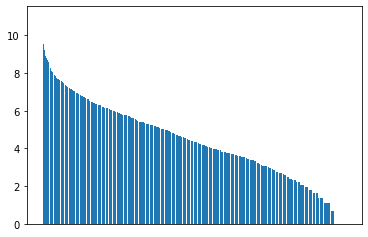

In [53]:
plt.bar(df_category['category'], 
        np.log(df_category['count']))
plt.xticks([], []);

In [0]:
# path = "/content/drive/My Drive/data/2019-12-06 yelp/yelp_dataset/csv_out/category.csv"
# df_category.to_csv(path, index=False)

# Category wordcloud

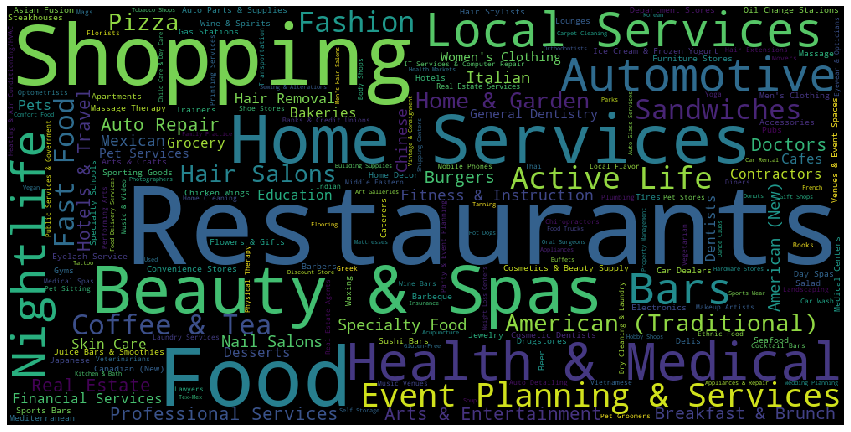

In [56]:
wordcloud = WordCloud(width = 1000, height = 500)\
    .generate_from_frequencies(dict_category)
plt.figure(figsize=(15,8))
plt.imshow(wordcloud)
plt.axis("off");

# Review for one Coffee place

In [3]:
path = "/content/drive/My Drive/data/2019-12-06 yelp/yelp_dataset/csv_out/review.csv"
df_review = pd.read_csv(path)
print(df_review.shape)
df_review.head()

(6685902, 9)


,review_id,user_id,business_id,stars,useful,funny,cool,text,date
0,Q1sbwvVQXV2734tPgoKj4Q,hG7b0MtEbXx5QzbzE6C_VA,ujmEBvifdJM6h6RLv4wQIg,1.0,6.0,1.0,0.0,Total bill for this horrible service? Over $8G...,2013-05-07 04:34:36
1,GJXCdrto3ASJOqKeVWPi6Q,yXQM5uF2jS6es16SJzNHfg,NZnhc2sEQy3RmzKTZnqtwQ,5.0,0.0,0.0,0.0,I *adore* Travis at the Hard Rock's new Kelly ...,2017-01-14 21:30:33
2,2TzJjDVDEuAW6MR5Vuc1ug,n6-Gk65cPZL6Uz8qRm3NYw,WTqjgwHlXbSFevF32_DJVw,5.0,3.0,0.0,0.0,I have to say that this office really has it t...,2016-11-09 20:09:03
3,yi0R0Ugj_xUx_Nek0-_Qig,dacAIZ6fTM6mqwW5uxkskg,ikCg8xy5JIg_NGPx-MSIDA,5.0,0.0,0.0,0.0,Went in for a lunch. Steak sandwich was delici...,2018-01-09 20:56:38
4,11a8sVPMUFtaC7_ABRkmtw,ssoyf2_x0EQMed6fgHeMyQ,b1b1eb3uo-w561D0ZfCEiQ,1.0,7.0,0.0,0.0,Today was my second out of three sessions I ha...,2018-01-30 23:07:38


In [5]:
# 61653	apdb7MGnmnx6nGWBJ0ch_g	Copper Star Coffee	4220 N 7th Ave	Phoenix	AZ	
df_cafe = df_review[df_review['business_id']=='apdb7MGnmnx6nGWBJ0ch_g']
print(df_cafe.shape)
df_cafe.head(3)

(587, 9)


,review_id,user_id,business_id,stars,useful,funny,cool,text,date
2006704,d-U95TlD8U4xuLOCZrQXmA,skrfPzullnRT67YL2i4emg,apdb7MGnmnx6nGWBJ0ch_g,4.0,1.0,0.0,0.0,Great atmosphere coffee shop in the Melrose ar...,2014-08-10 20:02:42
2006772,v1SqKwdBGWEi0KIiEPQYWA,2_jgFSykN-8KDDWqgm-HnQ,apdb7MGnmnx6nGWBJ0ch_g,5.0,0.0,0.0,0.0,"I had never been here before, it's so cool! Y...",2016-10-26 14:49:53
2007280,pumI4G62Zj6bWf8PnBgCxw,80ISTIPlwd1byKX9khtoKA,apdb7MGnmnx6nGWBJ0ch_g,5.0,0.0,0.0,0.0,What a great place! My sister in law and I sto...,2016-09-30 20:51:04


In [0]:
path = "/content/drive/My Drive/data/2019-12-06 yelp/yelp_dataset/csv_out/review_sample_cafe.csv"
# df_cafe.to_csv(path, index=False)